### 葵花卫星level2数据
- #### AHI-CHGT
    - CldOptDpth:云层光学深度
    - CldOptDpthAWIPS:用于AWIPS的云层光学深度。
    - CldTopHghtAWIPS:用于AWIPS的云层顶部高度
- #### AHI-CMSK
    - CloudMask:云层掩蔽，表示在图像中哪些区域被云层遮挡。
    - CloudMaskBinary:二进制格式的云层掩蔽
    - CloudProbability:云层概率，表示某像素为云的可能性。
    - IceCloudProbability:冰云的概率。
    - CloudMaskBinaryAWIPS:用于AWIPS的二进制格式的云层掩蔽。
    - CloudMaskQualFlagAWIPS:用于AWIPS的云层掩蔽的质量标志。
- #### AHI-CPHS
    - CloudPhase:云相（Cloud Phase），指云的物理状态，可能是冰、液态水或混合相
    - CloudType:云类型，指云的分类，如高层云、中层云、低层云等
    - CloudPhaseAWIPS:用于AWIPS的云相信息
    
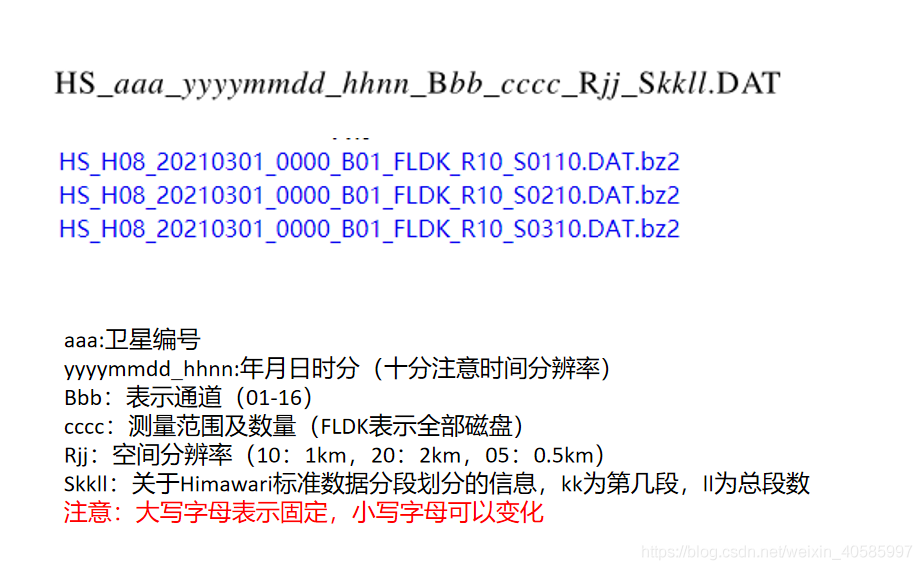

https://www.ssec.wisc.edu/software/geo2grid/readers/ahi_hsd.html

## looks like the visible and Level2 Cloud Mask looks different

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import metpy 
import glob
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.colors import ListedColormap

### Load Grid Data

In [2]:
import satpy
import glob

In [3]:
files = glob.glob('D:/Tommy/+WeatherData/Himawari/aws/level1/20240207-300/*.DAT')
scene = satpy.Scene(files, reader='ahi_hsd',reader_kwargs={'mask_space': False})

In [4]:
scene.load(['B01', 'B02', 'B03','B13'])

In [34]:
bb1=scene['B01']
bb2=scene['B02']
bb3=scene['B03']
bb13=scene['B13']
bb1

<xarray.DataArray 'clip-69d7f596c0de37a13fc785cee0c42357' (y: 11000, x: 11000)>
dask.array<concatenate, shape=(11000, 11000), dtype=float32, chunksize=(1100, 11000), chunktype=numpy.ndarray>
Coordinates:
    crs      object PROJCRS["unknown",BASEGEOGCRS["unknown",DATUM["unknown",E...
  * y        (y) float64 5.5e+06 5.499e+06 5.498e+06 ... -5.499e+06 -5.5e+06
  * x        (x) float64 -5.5e+06 -5.499e+06 -5.498e+06 ... 5.499e+06 5.5e+06
Attributes:
    orbital_parameters:   {'projection_longitude': 140.7, 'projection_latitud...
    time_parameters:      {'nominal_start_time': datetime.datetime(2024, 2, 7...
    sensor:               ahi
    id:                   DataID(name='B01', wavelength=WavelengthRange(min=0...
    platform_name:        Himawari-9
    wavelength:           0.47 µm (0.45-0.49 µm)
    name:                 B01
    resolution:           1000
    units:                %
    standard_name:        toa_bidirectional_reflectance
    start_time:           2024-02-07 03:00:00
    end_time:             2024-02-07 03:00:00
    reader:               ahi_hsd
    area:                 Area ID: FLDK\nDescription: AHI FLDK area\nProjecti...
    calibration:          reflectance
    modifiers:            ()
    _satpy_id:            DataID(name='B01', wavelength=WavelengthRange(min=0...
    ancillary_variables:  []

#### B1

(-5499500.035538887, 5499500.035538885, -5499500.035538885, 5499500.035538887)

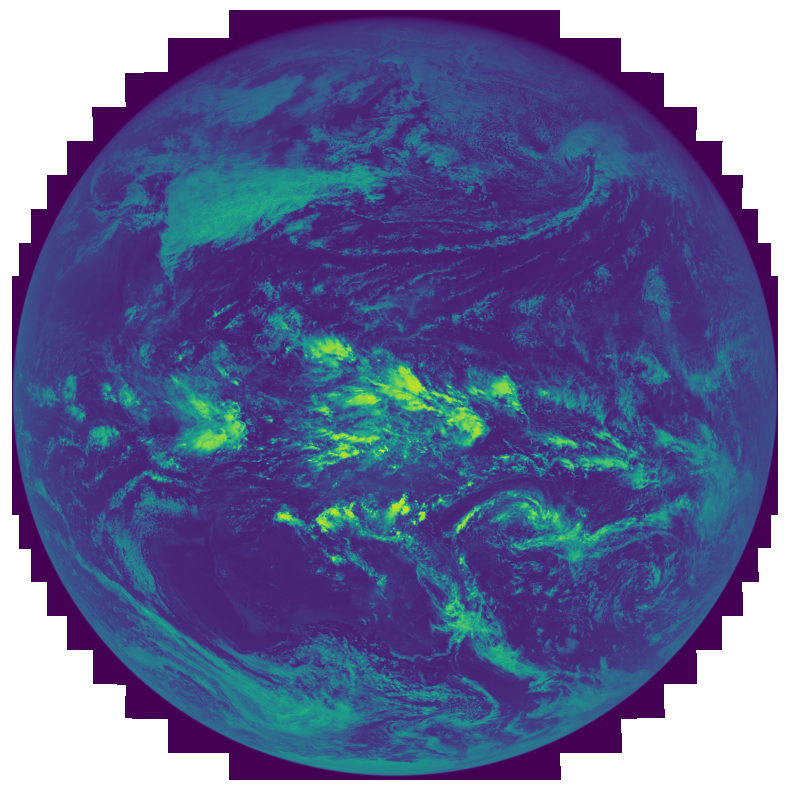

In [52]:
x = bb1['x'][:]
y = bb1['y'][:]
plt.figure(figsize=(10,10))
plt.imshow(bb1, extent=[x[0], x[-1], y[-1], y[0]])
plt.axis('off')

#### B13

(-5498999.901192693, 5498999.901192695, -5498999.901192695, 5498999.901192693)

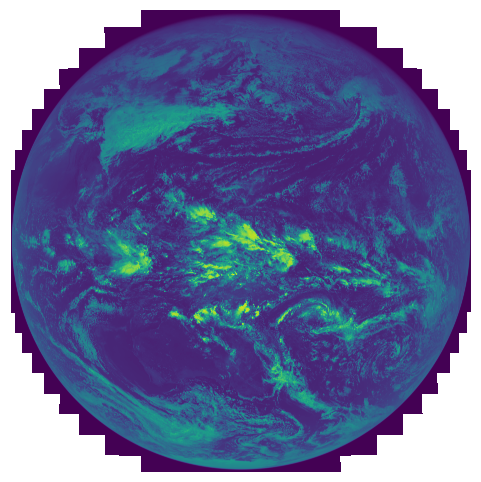

In [36]:
x = bb13['x'][:]
y = bb13['y'][:]
plt.figure(figsize=(6,6))
plt.imshow(b1, extent=[x[0], x[-1], y[-1], y[0]])
plt.axis('off')

In [38]:
bb3

<xarray.DataArray 'clip-7145d76fb065814ae53451d3b4215a9d' (y: 22000, x: 22000)>
dask.array<concatenate, shape=(22000, 22000), dtype=float32, chunksize=(2200, 22000), chunktype=numpy.ndarray>
Coordinates:
    crs      object PROJCRS["unknown",BASEGEOGCRS["unknown",DATUM["unknown",E...
  * y        (y) float64 5.5e+06 5.499e+06 5.499e+06 ... -5.499e+06 -5.5e+06
  * x        (x) float64 -5.5e+06 -5.499e+06 -5.499e+06 ... 5.499e+06 5.5e+06
Attributes:
    orbital_parameters:   {'projection_longitude': 140.7, 'projection_latitud...
    time_parameters:      {'nominal_start_time': datetime.datetime(2024, 2, 7...
    sensor:               ahi
    id:                   DataID(name='B03', wavelength=WavelengthRange(min=0...
    platform_name:        Himawari-9
    wavelength:           0.64 µm (0.62-0.66 µm)
    name:                 B03
    resolution:           500
    units:                %
    standard_name:        toa_bidirectional_reflectance
    start_time:           2024-02-07 03:00:00
    end_time:             2024-02-07 03:00:00
    reader:               ahi_hsd
    area:                 Area ID: FLDK\nDescription: AHI FLDK area\nProjecti...
    calibration:          reflectance
    modifiers:            ()
    _satpy_id:            DataID(name='B03', wavelength=WavelengthRange(min=0...
    ancillary_variables:  []

(-0.5, 10999.5, 10999.5, -0.5)

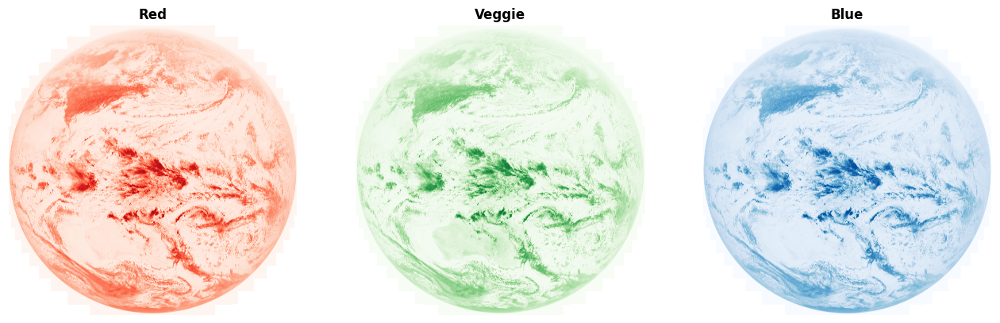

In [39]:
fig, ([ax1, ax2, ax3]) = plt.subplots(1, 3, figsize=(16, 5))

ax1.imshow(bb2, extent=[x[0], x[-1], y[-1], y[0]], cmap='Reds')
ax1.set_title('Red', fontweight='bold')
ax1.axis('off')

ax2.imshow(bb3, cmap='Greens')
ax2.set_title('Veggie', fontweight='bold')
ax2.axis('off')

ax3.imshow(bb1, cmap='Blues')
ax3.set_title('Blue', fontweight='bold')
ax3.axis('off')

### RGB真彩填色
大家可以试试用不同的方法设置RGB，达到自己想要的效. 两种对比度增强的方式有各自的优缺点。

- **第一种方式（第一段代码**）使用了非线性的幂函数转换来增强对比度，然后通过np.clip函数将值限制在0和1之间。
    - 优点如下：
        - 对比度增强更强烈：幂函数转换可以显著增强图像的对比度，使得细节更加突出。
    - 缺点如下：
        - 数据类型变化：最终生成的RGB图像是浮点类型的数组，相比于无符号整数类型，需要更多的内存存储和计算资源。

- **第二种方式（第二段代码**）使用了线性缩放的方式进行对比度增强，并将值限制在0和255之间。
    - 优点如下：
        - 数据类型保持不变：最终生成的RGB图像是无符号整数类型(uint8)的数组，节省了内存存储和计算资源。
    - 缺点如下：
        - 对比度增强相对较弱：线性缩放对比度增强的效果相对较弱，可能无法显著改善图像细节的可见性。

综上所述，第一种方式以非线性幂函数转换为基础的对比度增强效果更强烈，但需要更多的计算资源和内存存储；
而第二种方式以线性缩放为基础的对比度增强效果较弱，但在数据类型保持不变的情况下，节省了计算资源和内存存储。
选择适合的方式取决于具体的需求和应用场景

#### This function can't be done now, due to the resolution from B3 is different from B1 an B2

In [ ]:
#此处为第一种方法
##提取3个波段为RGB
'''
rgb = np.stack((
b1.to_numpy(),
b2.to_numpy(),
b3.to_numpy(),
), axis=-1)

#扩充RGB值范围使对比度增强
rgb = np.clip((rgb/0.7)**0.7, 0, 1)
'''
#此处注释的代码是第二种RGB图像增强方法
vmin = 0
vmax = 0.5
B1 = b1.clip(vmin, vmax) / vmax * 255
B2 = b2.clip(vmin, vmax) / vmax * 255
#B3 = b3.clip(vmin, vmax) / vmax * 255

rgb = np.stack((B3, B2, B1), axis=2).astype('uint8')

# Plot image
plt.figure(figsize=(12,12))
plt.imshow(rgb, extent=[x[0], x[-1], y[-1], y[0]])
# Add labels
plt.title('Himawari 8 \n', fontsize=20)

# Adjust tick mark size
plt.tick_params(labelsize=16)
plt.show()

###　Level２数据看是否一致

In [40]:
# Define parameters from your Proj4 string
a = 6378137.0
b = 6356752.3
lon_0 = 140.7
lat_0 = 0.0
h = 35785863.0

# Create the Geostationary projection object
h9_crs = ccrs.Geostationary(central_longitude=lon_0, satellite_height=h, globe=None)

In [41]:
data = np.load(r'D:\Tommy\+WeatherData\Himawari\himawari9_fulldisk_xy.npz')
x = data['x']
y = data['y']

In [42]:
h9_msk = xr.open_dataset(r'D:\downloads\AHI-CMSK_v1r1_h09_s202402030300210_e202402030309404_c202402030317568.nc')
b1 = h9_msk['CloudMaskBinary'][:,:]
b2 = h9_msk['CloudProbability'][:,:]

In [43]:
mask = b1 == 0
masked_array = np.ma.array(b1, mask=mask)

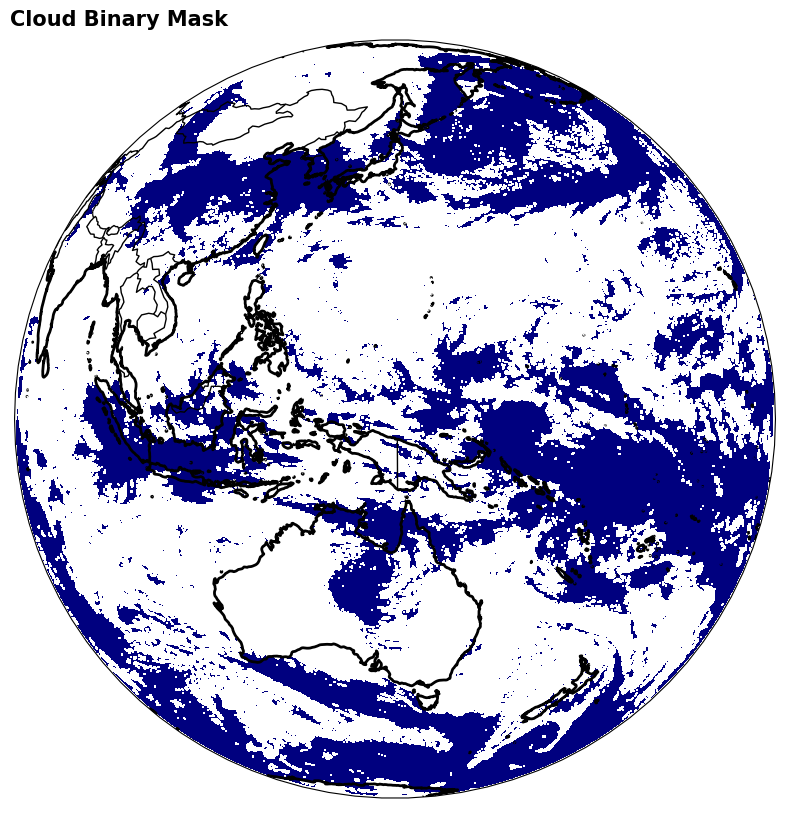

In [44]:
fig = plt.figure(figsize=(10, 10))
# Create axis with Geostationary projection
ax = fig.add_subplot(1, 1, 1, projection=h9_crs)

ax.imshow(masked_array, origin='upper',extent=(x.min(), x.max(), y.min(), y.max()), transform=h9_crs, cmap='jet')

# Add Coastlines and States
ax.coastlines(resolution='50m', color='black', linewidth=2)
ax.add_feature(ccrs.cartopy.feature.BORDERS, linewidth=1)
#ax.set_extent([70, 130, 10, 50], crs=ccrs.PlateCarree())  

plt.title('Cloud Binary Mask', loc='left', fontweight='bold', fontsize=15)

plt.show()

In [45]:
mask = b2 <=0.2
masked_array = np.ma.array(b2, mask=mask)

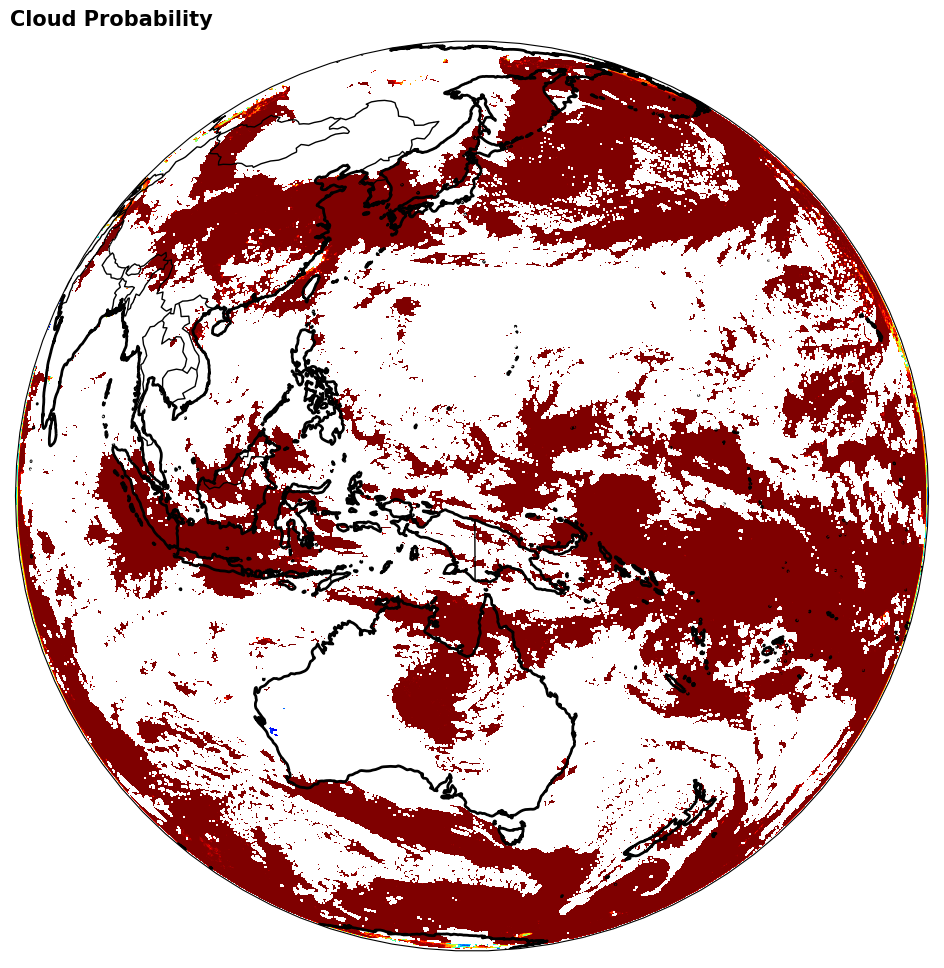

In [46]:
fig = plt.figure(figsize=(15, 12))
# Create axis with Geostationary projection
ax = fig.add_subplot(1, 1, 1, projection=h9_crs)

ax.imshow(masked_array, origin='upper',extent=(x.min(), x.max(), y.min(), y.max()), transform=h9_crs, cmap='jet')

# Add Coastlines and States
ax.coastlines(resolution='50m', color='black', linewidth=2)
ax.add_feature(ccrs.cartopy.feature.BORDERS, linewidth=1)
#ax.set_extent([70, 130, 10, 50], crs=ccrs.PlateCarree())  

plt.title('Cloud Probability', loc='left', fontweight='bold', fontsize=15)

plt.show()

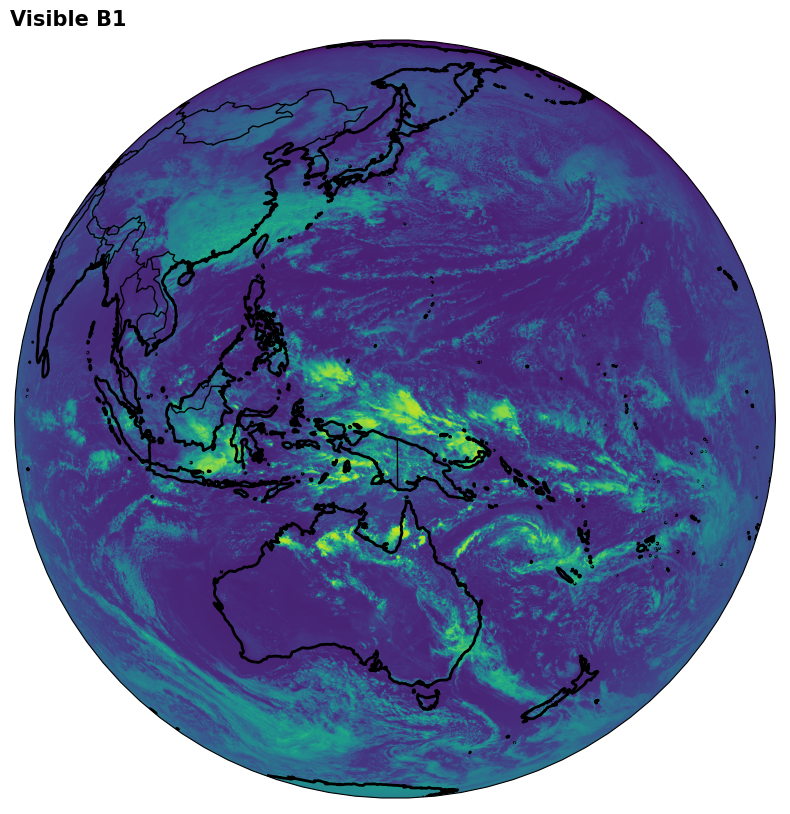

In [33]:
fig = plt.figure(figsize=(10, 10))
# Create axis with Geostationary projection
ax = fig.add_subplot(1, 1, 1, projection=h9_crs)

ax.imshow(bb1, origin='upper',extent=(x.min(), x.max(), y.min(), y.max()), transform=h9_crs)

# Add Coastlines and States
ax.coastlines(resolution='50m', color='black', linewidth=2)
ax.add_feature(ccrs.cartopy.feature.BORDERS, linewidth=1)
#ax.set_extent([70, 130, 10, 50], crs=ccrs.PlateCarree())  

plt.title('Visible B1', loc='left', fontweight='bold', fontsize=15)

plt.show()

C:\Users\wangt\AppData\Local\anaconda3\envs\pt\lib\site-packages\dask\core.py:127: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))


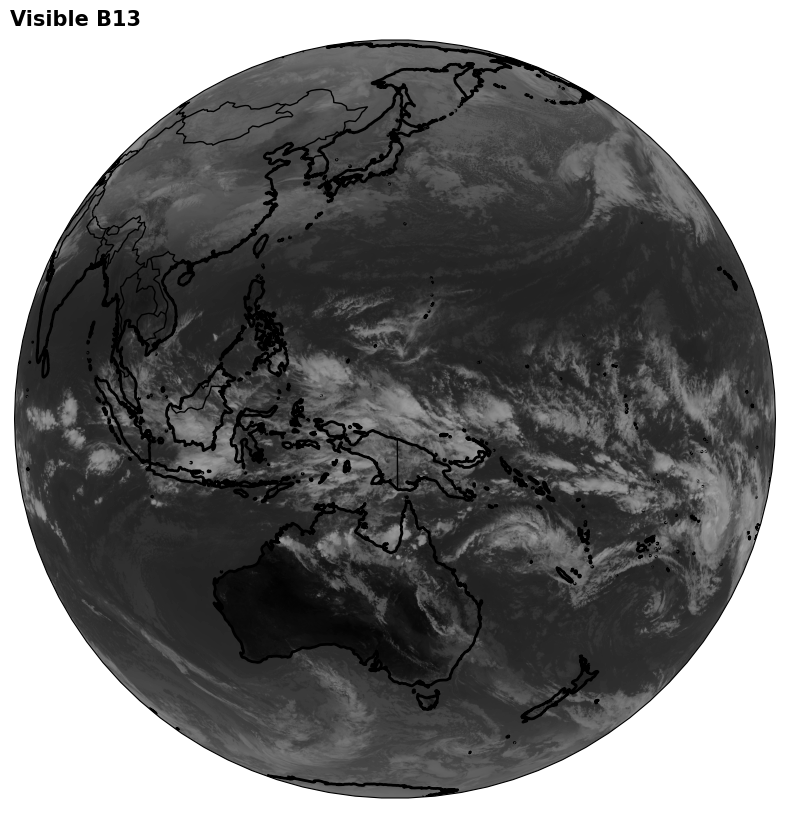

In [51]:
fig = plt.figure(figsize=(10, 10))
# Create axis with Geostationary projection
ax = fig.add_subplot(1, 1, 1, projection=h9_crs)

ax.imshow(bb13, origin='upper',extent=(x.min(), x.max(), y.min(), y.max()), transform=h9_crs,cmap='Grays')

# Add Coastlines and States
ax.coastlines(resolution='50m', color='black', linewidth=2)
ax.add_feature(ccrs.cartopy.feature.BORDERS, linewidth=1)
#ax.set_extent([70, 130, 10, 50], crs=ccrs.PlateCarree())  

plt.title('Visible B13', loc='left', fontweight='bold', fontsize=15)

plt.show()

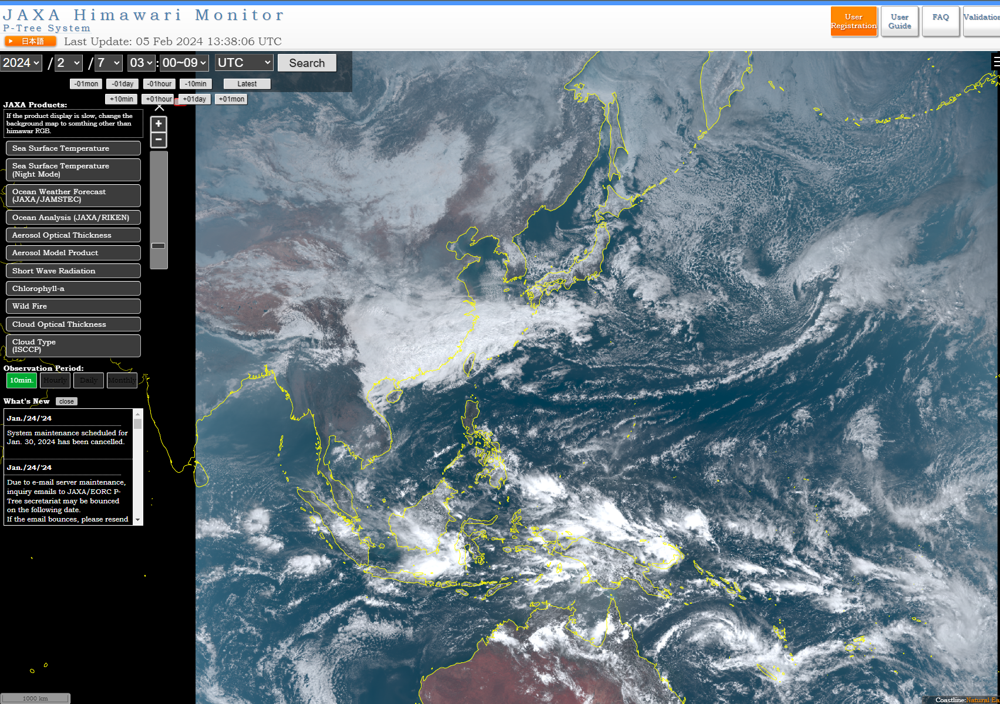

https://himawari8.nict.go.jp/img/FULL_24h/B13/2d/550/2024/02/07/183000_0_0.png
https://himawari8.nict.go.jp/img/FULL_24h/B13/2d/550/2024/02/07/183000_0_1.png
https://himawari8.nict.go.jp/img/FULL_24h/B13/2d/550/2024/02/07/183000_1_0.png
https://himawari8.nict.go.jp/img/FULL_24h/B13/2d/550/2024/02/07/183000_1_1.png

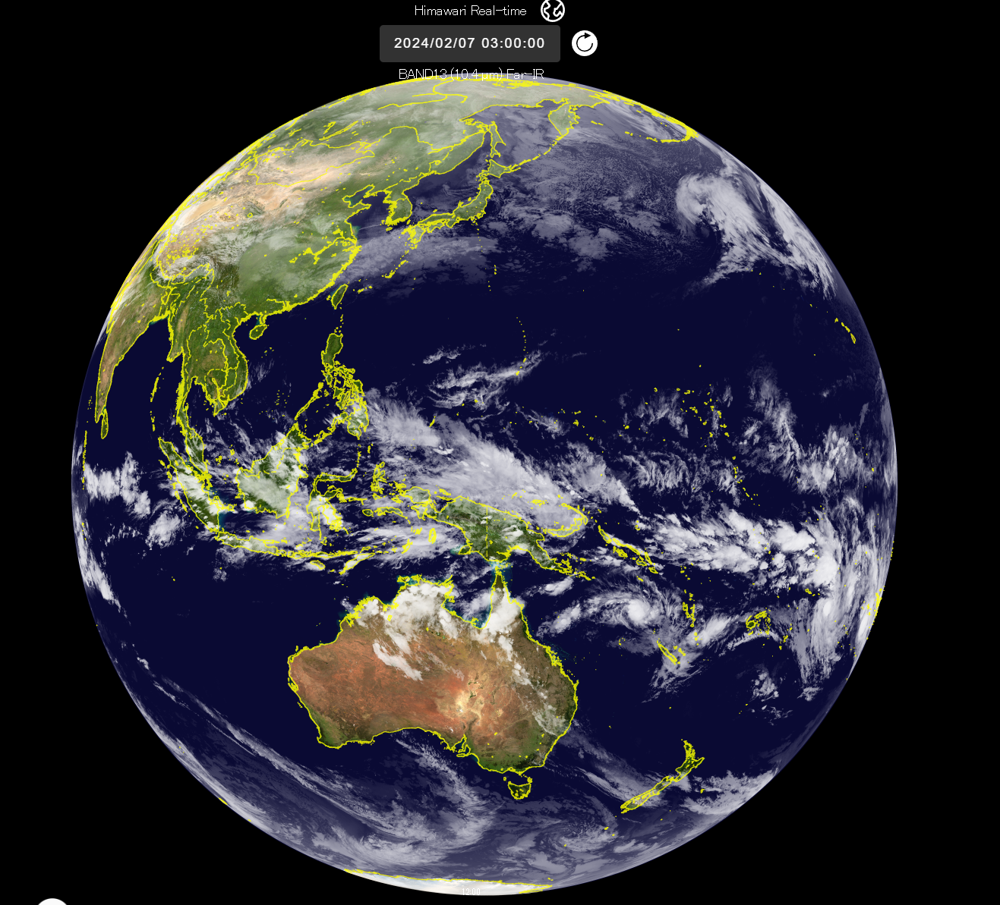

## Introduction of H9 Data over AWS
https://docs.opendata.aws/noaa-himawari/2020July08_NOAA_Himawari.pdf

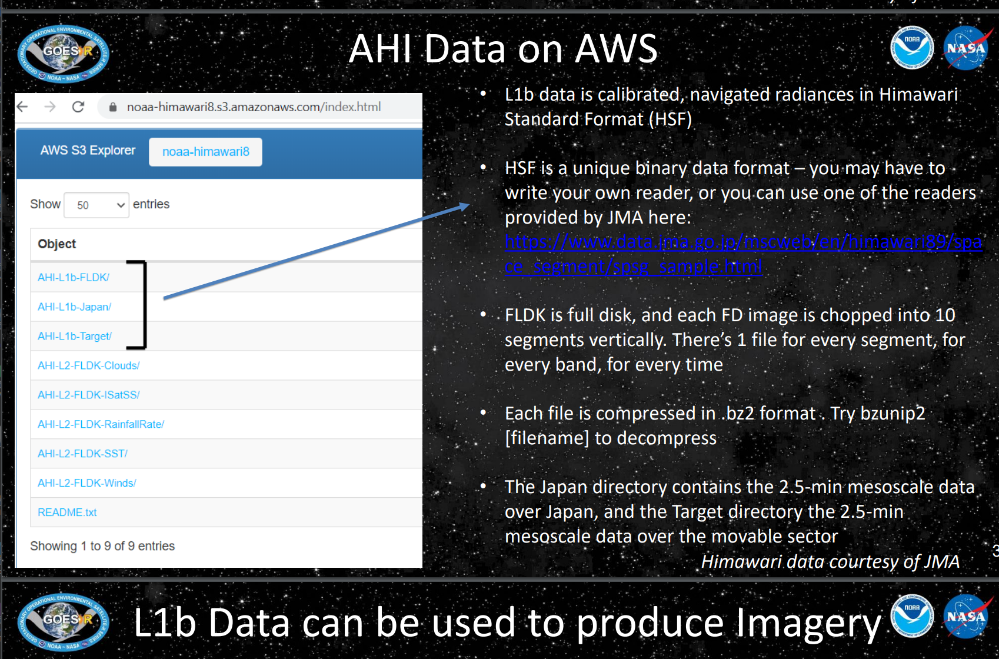

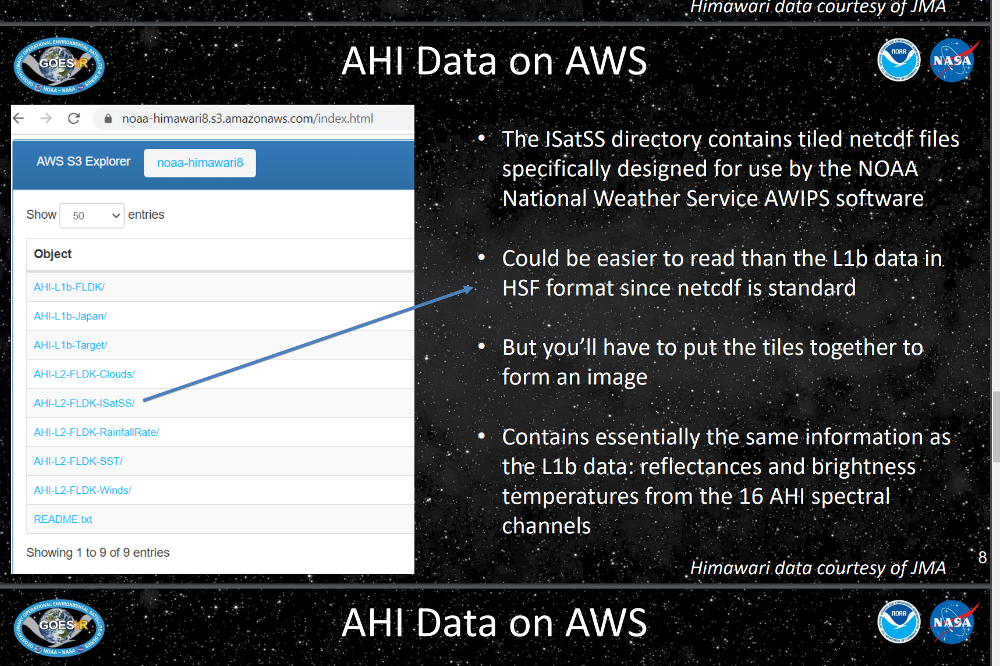

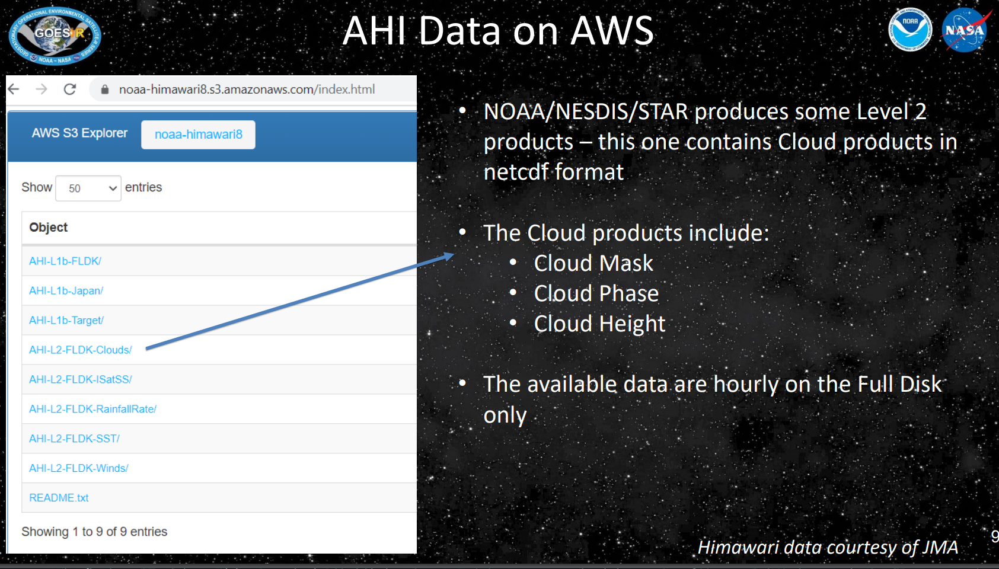